In [1]:
import cv2
import numpy as np
import pandas as pd
from ultralytics import YOLO
import glob
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
HOME = 'e:\\TIFR Project\\combine\\'
PATH = f"{HOME}\\outs\\Conventionally_named_holes"


image 1/1 e:\TIFR Project\combine\outs\Conventionally_named_holes\S001_999_096_999.jpg: 640x576 1 5_SignalPad, 2132.1ms
Speed: 211.2ms preprocess, 2132.1ms inference, 79.9ms postprocess per image at shape (1, 3, 640, 576)
C:\Users\ayush\AppData\Local\Temp\ipykernel_16512\3897168225.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  confidence = np.float64(result.boxes.conf.cpu().numpy())

image 1/1 e:\TIFR Project\combine\outs\Conventionally_named_holes\S002_082_081_066.jpg: 640x576 1 1_SignalPad, 1 5_SignalPad, 1 9_SignalPad, 273.1ms
Speed: 4.5ms preprocess, 273.1ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 e:\TIFR Project\combine\outs\Conventionally_named_holes\S003_113_112_097.jpg: 640x576 1 1_SignalPad, 1 9_SignalPad, 299.4ms
Speed: 4.0ms preprocess, 299.4ms inference, 4.

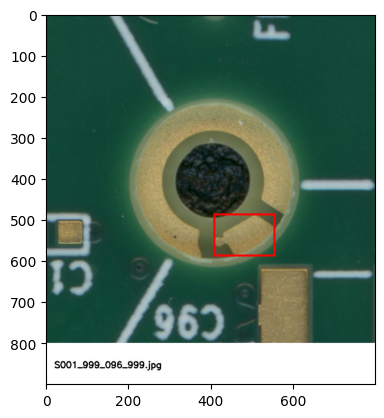

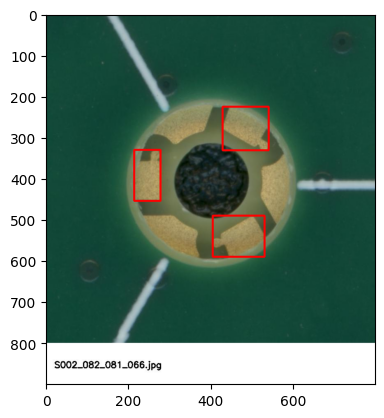

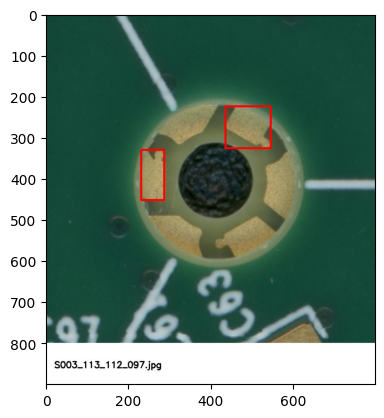

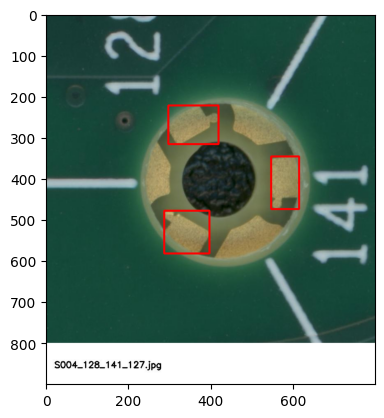

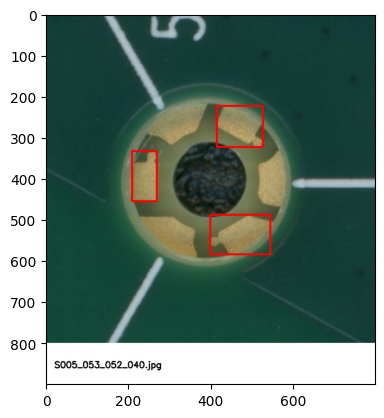

...

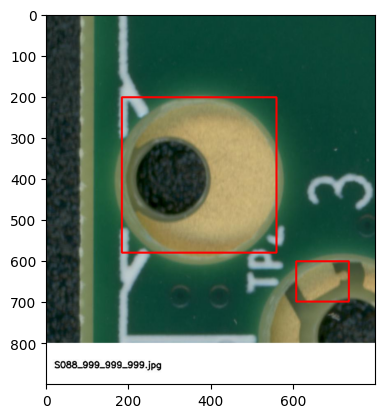

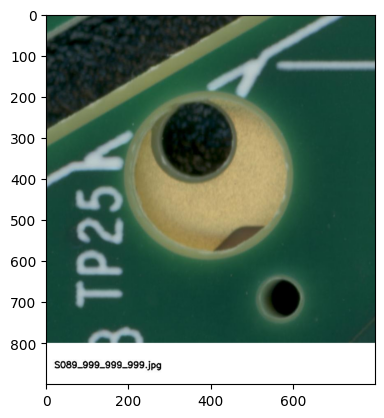

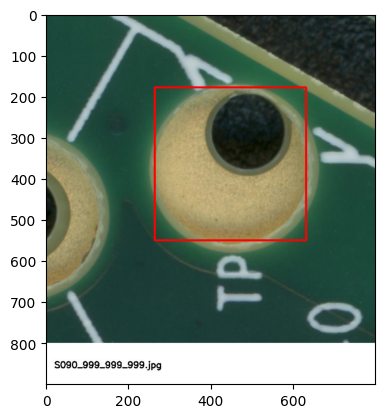

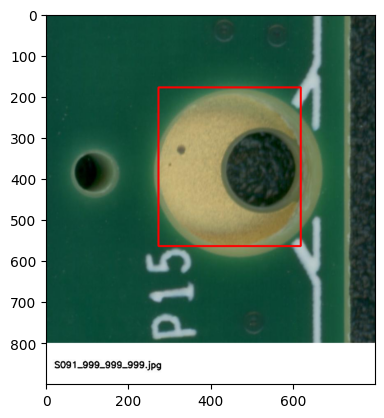

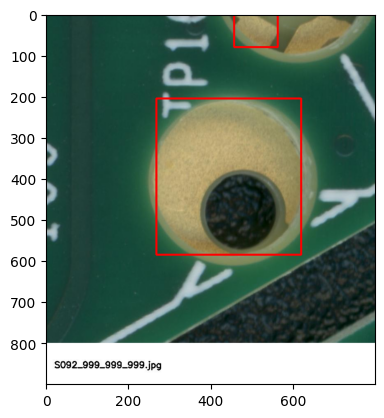

In [3]:
my_model = YOLO(f'{HOME}training\\bestv8.pt')
DPI = None

classes = []
Area11 = [0] * 92
Area1 = [0] * 92
Area3 = [0] * 92
Area5 = [0] * 92
Area7 = [0] * 92
Area9 = [0] * 92

for idx, image_path in enumerate(glob.glob(f'{PATH}\\*.jpg')):
  results = list(my_model(image_path, conf=0.5))
  result = results[0]
  box_vis = cv2.imread(image_path)

  if DPI is None:
    DPI = Image.open(image_path).info["dpi"][0]

  confidence = np.float64(result.boxes.conf.cpu().numpy())
  bxs = np.int64(result.boxes.xywh.cpu().numpy())
  test_list = result.boxes.cls.cpu().numpy().tolist()

  for i, box in enumerate(bxs):
    cv2.rectangle(box_vis, (box[0] - box[2] // 2, box[1] - box[3] // 2), (box[0] + box[2] // 2, box[1] + box[3] // 2), (0, 0, 255), 3)    

  rgb_img = cv2.cvtColor(box_vis, cv2.COLOR_BGR2RGB)
  pil_img = Image.fromarray(rgb_img)
  pil_img.save(f"{PATH}_ctrs\\" + image_path.split("\\")[-1], dpi=(DPI, DPI))

  plt.figure()
  plt.imshow(rgb_img)

  [classes.append(x) for x in test_list if x not in classes]

  if result.masks is not None:
    no = -1 if not (6 in classes) else classes.index(6)
    maskList = []
    [maskList.append((result.masks.data[int(a)].cpu().numpy() * 255).astype("uint8")) for a in range(len(result.masks.data)) if a != no]

    for _class, mask in enumerate(maskList):
      edged = cv2.Canny(mask, 30, 200)
      contours, hierarchy = cv2.findContours(edged,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

      for j in range(0, len(contours)):
        if classes[_class] != 6 or _class > 3:
          area = cv2.contourArea(contours[j])
          if classes[_class] == 0:
            Area11[idx] = area
          elif classes[_class] == 1:
            Area1[idx] = area
          elif classes[_class] == 2:
            Area3[idx] = area
          elif classes[_class] == 3:
            Area5[idx] = area
          elif classes[_class] == 4:
            Area7[idx] = area
          elif classes[_class] == 5:
            Area9[idx] = area

In [4]:
data={'Area11': Area11, 'Area1': Area1, 'Area3': Area3, 'Area5': Area5, 'Area7': Area7, 'Area9': Area9}
data_frame = pd.DataFrame(data)
data_frame.to_csv("../outs/area.csv")
data_frame

,Area11,Area1,Area3,Area5,Area7,Area9
0,0.0,0.0,0,3888.5,0,0.0
1,0.0,3512.5,0,3474.0,0,3485.5
2,0.0,0.0,0,3291.5,0,3413.0
3,0.0,3258.0,0,3285.0,0,3395.0
4,0.0,3819.0,0,3410.0,0,3221.5
...,...,...,...,...,...,...
87,0.0,0.0,0,3648.5,0,36162.0
88,0.0,0.0,0,0.0,0,0.0
89,0.0,0.0,0,132.5,0,0.0
90,0.0,0.0,0,34089.0,0,0.0


In [5]:
def get_vid(dir, filename="../outs/video_ctrs.avi"):
    paths = glob.glob(dir)
    print(len(paths))

    if paths is None: return

    images = []
    for im_path in paths:
        img = cv2.imread(im_path)
        images.append(img)

    fourcc = cv2.VideoWriter_fourcc(*'DIVX')
    out = cv2.VideoWriter(filename, fourcc, 0.5, (images[0].shape[1], images[0].shape[0]), True)

    for img in images:
        out.write(img)
    out.release()

In [6]:
get_vid("e:\\TIFR Project\\combine\\outs\\Conventionally_named_holes_ctrs\\*.jpg")

92
